# Bike Sharing

- `instant`: record index
- `dteday` : date
- `season` : season (1:springer, 2:summer, 3:fall, 4:winter)
- `yr` : year (0: 2011, 1:2012)
- `mnth` : month ( 1 to 12)
- `hr` : hour (0 to 23)
- `holiday` : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- `weekday` : day of the week
- `workingday` : if day is neither weekend nor holiday is 1, otherwise is 0.
+ `weathersit` : 
	- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
	- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
	- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
	- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- `temp` : Normalized temperature in Celsius. The values are divided to 41 (max)
- `atemp`: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- `hum`: Normalized humidity. The values are divided to 100 (max)
- `windspeed`: Normalized wind speed. The values are divided to 67 (max)
- `casual`: count of casual users
- `registered`: count of registered users
- `cnt`: count of total rental bikes including both casual and registered

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, RidgeCV, Lasso, ElasticNet
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
from pycaret.regression import *

In [2]:
data = pd.read_csv("bike-sharing_hourly.csv")
data

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


## PART I: Exploratory Data Analysis

### Exploratory Analysis

#### Bike Rentals Over Time

Since we have the variable *dteday*, we can plot a time series with the number of bikes rented per day. With this graph we can quickly see if there are differences in the number of bikes rented over time. 

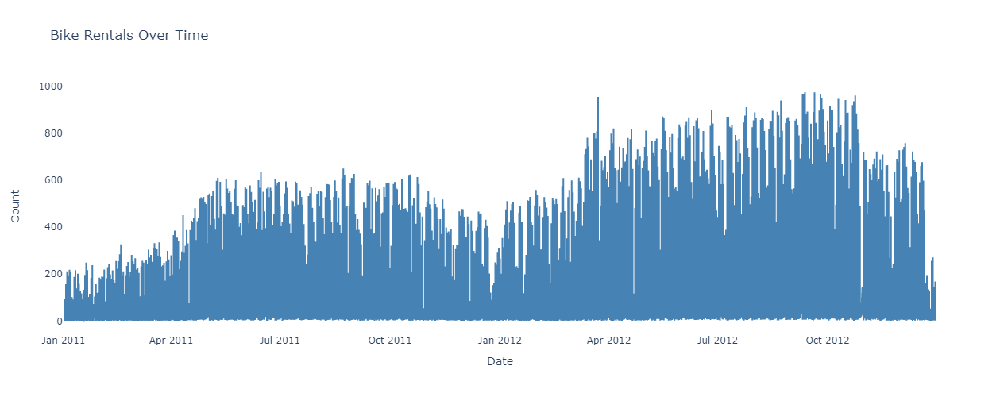

In [3]:
#Time series for the number of bikes rented.
fig = go.Figure()
fig.add_trace(go.Scatter(x=data['dteday'], y=data['cnt'],
                         line=dict(color="steelblue", width=2), 
                         name='Bike Rentals'))
fig.update_layout(title='Bike Rentals Over Time', xaxis_title='Date', yaxis_title='Count', width=1200, height=500)

# Modify the plot layout to remove the background color and grid lines
fig.update_layout(
    plot_bgcolor="rgba(0,0,0,0)",  # Set the plot background color to transparent
    xaxis=dict(showgrid=False),   # Hide the x-axis grid lines
    yaxis=dict(showgrid=False),   # Hide the y-axis grid lines
)

fig.show()

By analysing this graph, we can extract some insights:
- Overall, more bikes were rented during 2012 than during 2011.
- Around January there is an appreciable decrease on the number of bikes rented.

We are also going to plot the time series of the amount of bikes rented by *registered* and *casual* consumers.

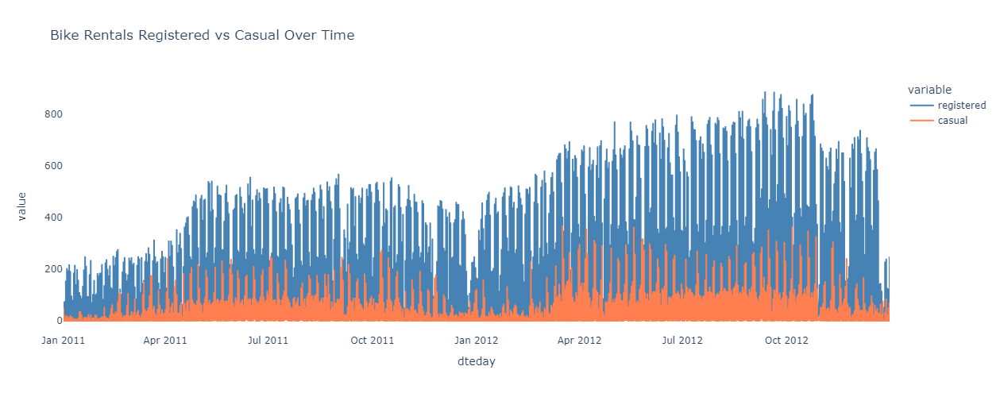

In [4]:
#Time series for the number of bikes rented of registered vs casual
fig = px.line(data, x='dteday', y=['registered', 'casual'], 
              color_discrete_sequence = ["steelblue", "coral"],
              title='Bike Rentals Registered vs Casual Over Time', width = 1200, height = 500)

# Modify the plot layout to remove the background color and grid lines
fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)',  # Set the plot background color to transparent
    xaxis=dict(showgrid=False),   # Hide the x-axis grid lines
    yaxis=dict(showgrid=False),   # Hide the y-axis grid lines
)

fig.show()


We can conclude that the majority of bikes are rented by *registered* clients.

#### season

We are going to analyse the variable *season* to see how it affects the number of bikes rented. The first thing we are going to check is the total number of bikes rented per season in both years.

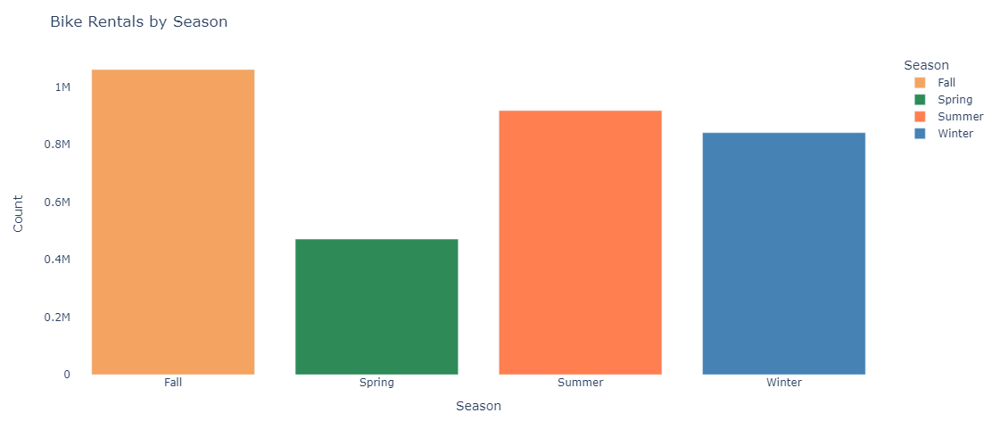

In [5]:
# Define the pastel colors for each season
colors = ["sandybrown", "seagreen", "coral", "steelblue"]

# Create a new column with the labels of the seasons
season_dict = {1: 'Spring', 2: 'Summer', 3: 'Fall', 4: 'Winter'}
data['season_labels'] = data['season'].replace(season_dict)

# Groupby to obtain the total number of bikes rented per season
season_counts = data.groupby('season_labels')['cnt'].sum().reset_index()

# Plot the result with pastel colors for each season
fig = px.bar(season_counts, x='season_labels', y='cnt', color='season_labels',
             color_discrete_sequence=colors, labels={'season_labels': 'Season', 'cnt': 'Count'})
fig.update_layout(title='Bike Rentals by Season',
                  plot_bgcolor='rgba(0,0,0,0)',
                  xaxis=dict(showgrid=False),  
                  yaxis=dict(showgrid=False),  
                  width=800, height=500)
fig.show()


It can be seen that the order is Fall, Summer, Winter and Spring.

Let's do the same thing but including the year.

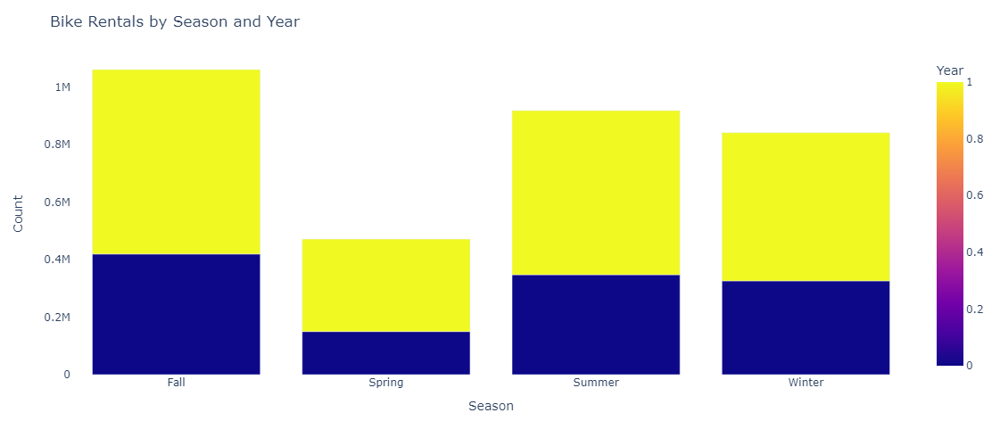

In [6]:
season_yr_count = data.groupby(["yr", "season_labels"])["cnt"].sum()

#Plot the result
fig = px.bar(season_yr_count.reset_index(), x='season_labels', y='cnt', color="yr",
             labels={'season_labels': 'Season', 'cnt': 'Count', 'yr': 'Year'})
fig.update_layout(title='Bike Rentals by Season and Year',
                  plot_bgcolor='rgba(0,0,0,0)',
                  xaxis=dict(showgrid=False),  
                  yaxis=dict(showgrid=False),  
                  width=800, height=500)
fig.show()

- For 2011: Fall, Summer, Winter and Spring.
- For 2012: Fall, Summer, Winter and Spring.

Same order as before, nothing super interesting here.

Let's try it by hour of the day.

In [7]:
#Group by hour and season
data_season_hr = data.groupby(["season_labels", "hr"])["cnt"].sum()
data_season_hr.head()

season_labels  hr
Fall           0     13822
               1      8132
               2      5716
               3      2930
               4      1541
Name: cnt, dtype: int64

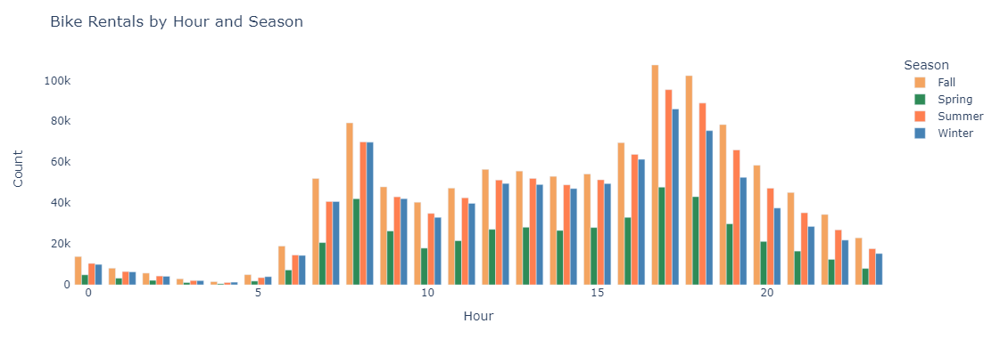

In [8]:
#Plot of this information
fig = px.bar(data_season_hr.reset_index(), x='hr', y='cnt', color='season_labels', color_discrete_sequence=colors, barmode='group',
             labels={'hr': 'Hour', 'cnt': 'Count', 'season_labels': 'Season'})
fig.update_layout(title='Bike Rentals by Hour and Season',
                  plot_bgcolor='rgba(0,0,0,0)',
                  xaxis=dict(showgrid=False),  
                  yaxis=dict(showgrid=False),  
                  width=1200, height=400)
fig.show()

After analysing each season in particular, the conclusion is that there are no real differences on the hours between seasons. The top and worst hours are the same across all seasons.

- Top hours: 16 - 19 (job exits) and 8 (job enter).
- Worst hours: 0-6 (night).

Lastly, I am going to drop the temporal column *season_labels*

In [9]:
data = data.drop(columns = "season_labels")

#### holiday

Amount of bikes rented per *holiday*.

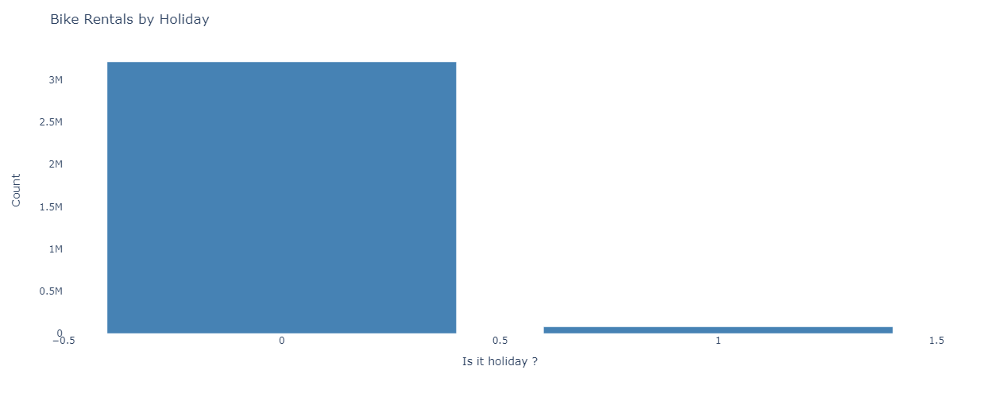

In [10]:
#Groupby to obtain the total number of bikes rented per holiday
holiday_count = data.groupby("holiday")["cnt"].sum().reset_index()

color = ["steelblue"]

#Plot the result
fig = px.bar(holiday_count, x='holiday', y='cnt', 
             color_discrete_sequence = color,
             labels={'holiday': 'Is it holiday ? ', 'cnt': 'Count'})
fig.update_layout(title='Bike Rentals by Holiday',
                  plot_bgcolor='rgba(0,0,0,0)',
                  xaxis=dict(showgrid=False),  
                  yaxis=dict(showgrid=False),  
                  width=500, height=500)
fig.show()

- From the total amount of bikes rented, only **2.3% are rented during holidays**.

#### weekday

Amount of bikes rented per *weekday*.

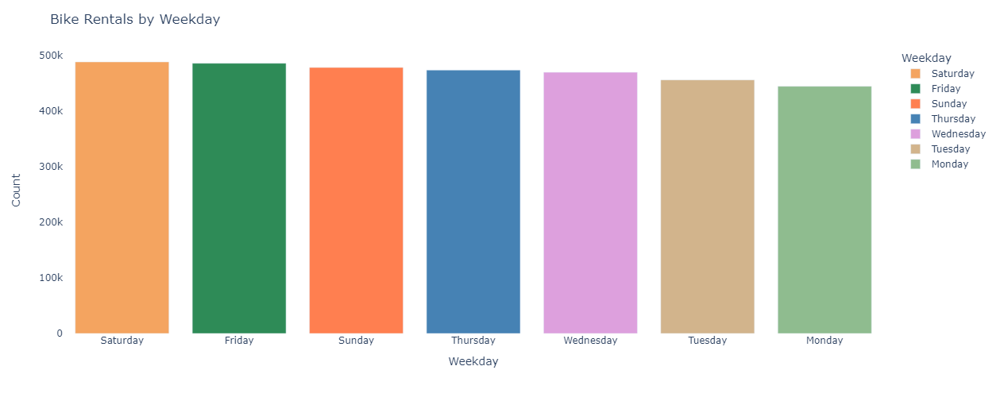

In [11]:
#Dic to create a new column with the labels of the weekdays
weekday_dict = {0: 'Monday', 1: 'Tuesday',2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
#Temp season label column
data['weekday_labels'] = data['weekday'].replace(weekday_dict)
#Groupby to obtain the total number of bikes rented per weekday
weekday_count = data.groupby("weekday_labels")["cnt"].sum().sort_values(ascending = False).reset_index()
 
colors = ["sandybrown", "seagreen", "coral", "steelblue", "plum", "tan","darkseagreen" ]


#Plot the result
fig = px.bar(weekday_count, x='weekday_labels', y='cnt', labels={'weekday_labels': 'Weekday', 'cnt': 'Count'},
            color = "weekday_labels",
            color_discrete_sequence = colors)
fig.update_layout(title='Bike Rentals by Weekday',
                  plot_bgcolor='rgba(0,0,0,0)',
                  xaxis=dict(showgrid=False),  
                  yaxis=dict(showgrid=False),  width=800, height=500)
fig.show()

- The days with more bikes rented are **Friday, Saturday and Sunday**. In any case, the differences are not extremelly relevant across days.

We need to drop the temporal column *weekday_labels*

In [12]:
data = data.drop(columns = "weekday_labels")

#### weathersit

Amount of bikes rented per *weathersit*.

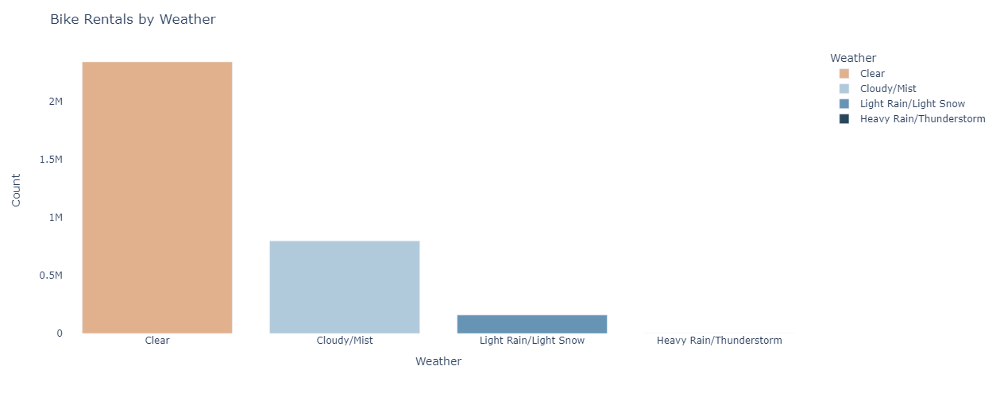

In [13]:
#Dic to create a new column with the labels of the weathersit
weathersit_dict = {1: 'Clear', 2: 'Cloudy/Mist', 3: 'Light Rain/Light Snow', 4: 'Heavy Rain/Thunderstorm'}
#Temp season label column
data['weathersit_labels'] = data['weathersit'].replace(weathersit_dict)
#Groupby to obtain the total number of bikes rented per weathersit
weekday_count = data.groupby("weathersit_labels")["cnt"].sum().sort_values(ascending = False).reset_index()
#Plot the result

colors = ["#e1b18e","#b0c9db", "#6794b5", "#28465c"]

fig = px.bar(weekday_count, x='weathersit_labels', y='cnt', labels={'weathersit_labels': 'Weather', 'cnt': 'Count'},
            color = "weathersit_labels",
            color_discrete_sequence = colors)
fig.update_layout(title='Bike Rentals by Weather', 
                  plot_bgcolor='rgba(0,0,0,0)',
                  xaxis=dict(showgrid=False),  
                  yaxis=dict(showgrid=False),  width=800, height=500)
fig.show()

- Clearly, the better the weather, the more bikes that are rented. From all the bikes rented, **71% have been rented when the weather was clear or with little clouds**.
- On the days with really bad weather, bikes are almost never rented. Only 223 bikes in total.

Finally, let's drop the column *weathersit_labels*.

In [14]:
data = data.drop(columns = 'weathersit_labels')

#### temp

Study of the distributtion of the column *temp*.

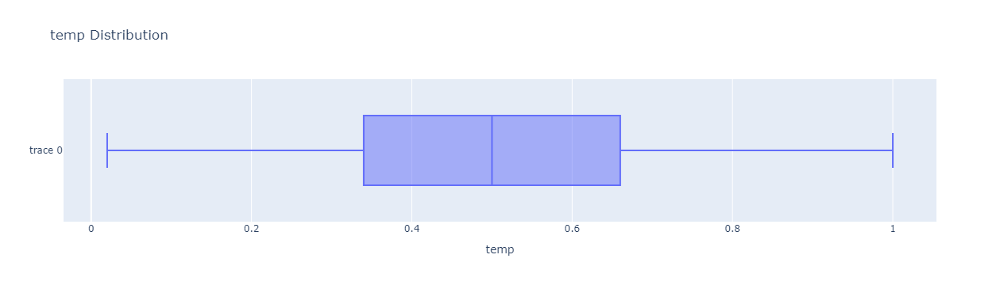

In [15]:
# Plot the horizontal box plot using Plotly
fig = go.Figure()
fig.add_trace(go.Box(x=data['temp'], orientation='h'))
fig.update_layout(title='temp Distribution', xaxis_title='temp')
# Show the plot
fig.show()

 - The median *temp* is 0.5, with a min of 0.02 and a max of 1.
 - There are not outliers on the *temp* variable.

We also going to try to plot the distributtion of bike rentals by *temp* and *season*.

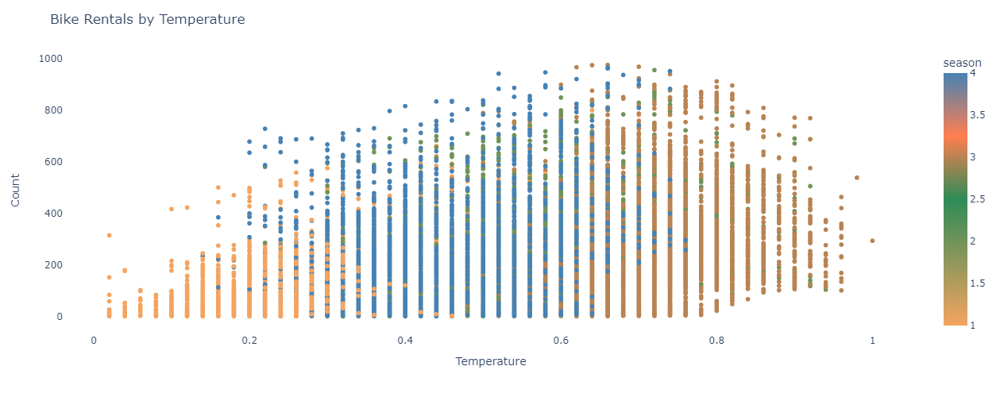

In [16]:
colors_season = ["sandybrown", "seagreen", "coral", "steelblue"] 


fig = px.scatter(data, x='temp', y='cnt', color='season',
                 hover_data=['season', 'temp', 'cnt'],
                 color_continuous_scale=[[0, "sandybrown"], [0.5, "seagreen"], [0.75, "coral"], [1, "steelblue"]])
                 
fig.update_layout(title='Bike Rentals by Temperature', xaxis_title='Temperature', yaxis_title='Count',
                   plot_bgcolor='rgba(0,0,0,0)',
                  xaxis=dict(showgrid=False),  
                  yaxis=dict(showgrid=False),  
                  width=800, height=500)
fig.show()

We can see how there is a trend of bikes rented with the temperature. As temperature increases, there is more possibility that the number of bikes rented also increases. 

#### atemp

Study of the distribution of the column *atemp*.

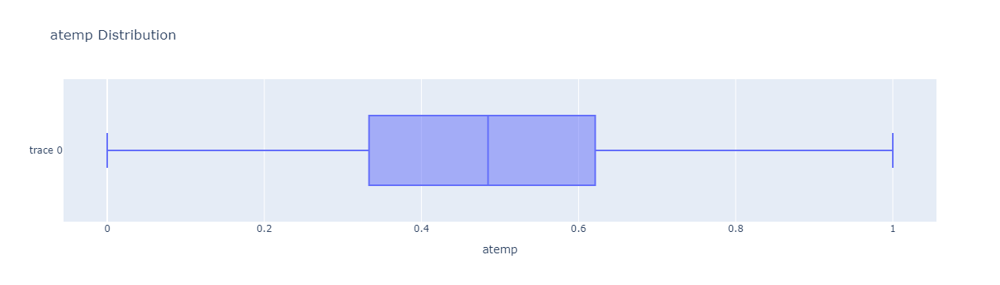

In [17]:
# Plot the horizontal box plot using Plotly
fig = go.Figure()
fig.add_trace(go.Box(x=data['atemp'], orientation='h'))
fig.update_layout(title='atemp Distribution', 
                  xaxis_title='atemp')
# Show the plot
fig.show()

 - The median *atemp* is 0.4848, with a min of 0 and a max of 1.
 - There are not outliers on the *atemp* variable.

#### hum

Study of the distribution of the column *hum*

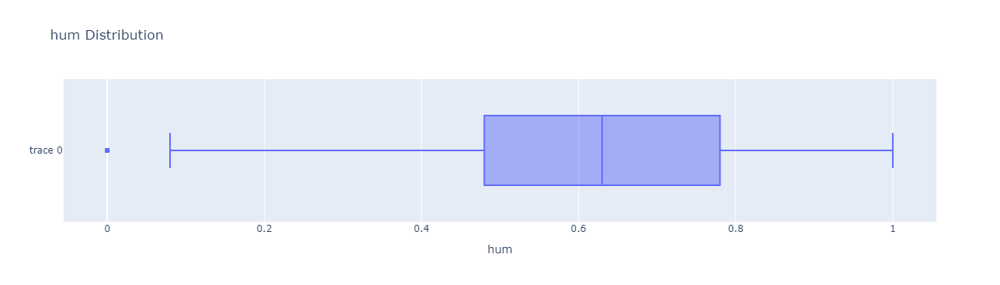

In [18]:
# Plot the horizontal box plot using Plotly
fig = go.Figure()
fig.add_trace(go.Box(x=data['hum'], orientation='h'))
fig.update_layout(title='hum Distribution', xaxis_title='hum')
# Show the plot
fig.show()

 - The median *hum* is 0.63, with a min of 0 and a max of 1.
 - The are outliers in the *hum* variable with value 0. We will study this more in depth.

Let's focus on the case when the *hum* value is 0. 

In [19]:
data[data["hum"] == 0]

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
1551,1552,2011-03-10,1,0,3,0,0,4,1,3,0.34,0.3182,0.0,0.2537,3,0,3
1552,1553,2011-03-10,1,0,3,1,0,4,1,3,0.34,0.3182,0.0,0.2537,0,2,2
1553,1554,2011-03-10,1,0,3,2,0,4,1,3,0.34,0.3182,0.0,0.2537,0,1,1
1554,1555,2011-03-10,1,0,3,5,0,4,1,3,0.36,0.3485,0.0,0.1940,1,2,3
1555,1556,2011-03-10,1,0,3,6,0,4,1,3,0.36,0.3333,0.0,0.3284,0,12,12
1556,1557,2011-03-10,1,0,3,7,0,4,1,3,0.38,0.3939,0.0,0.2239,1,36,37
1557,1558,2011-03-10,1,0,3,8,0,4,1,3,0.38,0.3939,0.0,0.2836,1,43,44
1558,1559,2011-03-10,1,0,3,9,0,4,1,3,0.40,0.4091,0.0,0.2239,1,23,24
1559,1560,2011-03-10,1,0,3,10,0,4,1,3,0.40,0.4091,0.0,0.1642,0,17,17
1560,1561,2011-03-10,1,0,3,11,0,4,1,3,0.40,0.4091,0.0,0.2537,6,5,11


Apparently, during the 3rd of March of 2011 something appears to have happened with the humidity measure. We need to fix this data. We have studied if there are any correlations with the *hum* variable in order to help us impute the values but there are none. Taking this into consideration, we are going to impute it by using the mean values from the previous and the following day since, normally, weather does not change drastically from one day to another.

In [20]:
#Mean from previou and following day
mean_prev_day = data[data["dteday"] == "2011-03-09"]["hum"].mean()
mean_foll_day = data[data["dteday"] == "2011-03-11"]["hum"].mean()
mean_hum = (mean_prev_day + mean_foll_day) / 2
#Impute the values of the dat 2011-03-10
data.loc[data["dteday"] == "2011-03-10", "hum"] = mean_hum
#Show the result
data[data["dteday"] == "2011-03-10"]

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
1551,1552,2011-03-10,1,0,3,0,0,4,1,3,0.34,0.3182,0.712491,0.2537,3,0,3
1552,1553,2011-03-10,1,0,3,1,0,4,1,3,0.34,0.3182,0.712491,0.2537,0,2,2
1553,1554,2011-03-10,1,0,3,2,0,4,1,3,0.34,0.3182,0.712491,0.2537,0,1,1
1554,1555,2011-03-10,1,0,3,5,0,4,1,3,0.36,0.3485,0.712491,0.1940,1,2,3
1555,1556,2011-03-10,1,0,3,6,0,4,1,3,0.36,0.3333,0.712491,0.3284,0,12,12
1556,1557,2011-03-10,1,0,3,7,0,4,1,3,0.38,0.3939,0.712491,0.2239,1,36,37
1557,1558,2011-03-10,1,0,3,8,0,4,1,3,0.38,0.3939,0.712491,0.2836,1,43,44
1558,1559,2011-03-10,1,0,3,9,0,4,1,3,0.40,0.4091,0.712491,0.2239,1,23,24
1559,1560,2011-03-10,1,0,3,10,0,4,1,3,0.40,0.4091,0.712491,0.1642,0,17,17
1560,1561,2011-03-10,1,0,3,11,0,4,1,3,0.40,0.4091,0.712491,0.2537,6,5,11


#### windspeed

Study of the distribution of the column *windspeed*

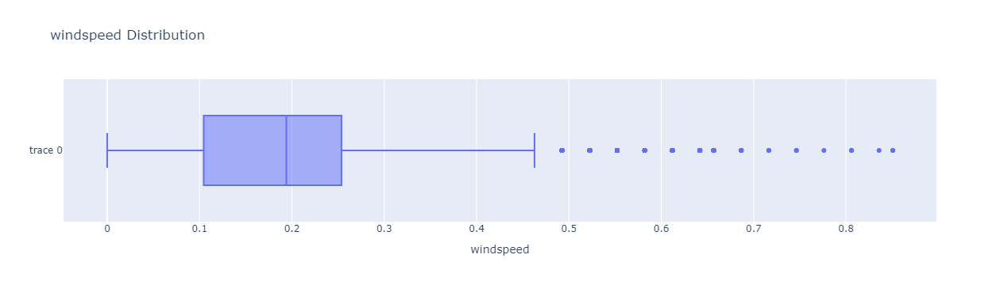

In [21]:
# Plot the horizontal box plot using Plotly
fig = go.Figure()
fig.add_trace(go.Box(x=data['windspeed'], orientation='h'))
fig.update_layout(title='windspeed Distribution', xaxis_title='windspeed')
# Show the plot
fig.show()

- The median *windspeed* is 0.194 with a min of 0 and a max of 0.8507.
- There are multiple outliers in the upper fence of the *windspeed* variable.

Let's explore the outliers of the *windspeed* variable.

In [22]:
data[data["windspeed"] > 0.4627].head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
175,176,2011-01-08,1,0,1,14,0,6,0,1,0.20,0.1667,0.32,0.4925,12,83,95
178,179,2011-01-08,1,0,1,17,0,6,0,1,0.16,0.1212,0.37,0.5522,5,64,69
194,195,2011-01-09,1,0,1,9,0,0,0,1,0.12,0.0758,0.46,0.5224,0,19,19
196,197,2011-01-09,1,0,1,11,0,0,0,1,0.16,0.1212,0.40,0.5224,2,47,49
265,266,2011-01-12,1,0,1,12,0,3,1,1,0.20,0.1515,0.47,0.5821,3,52,55


In [23]:
print("Mean cnt for windspeed outliers: ", data[data["windspeed"] > 0.4627]["cnt"].mean())
print("Mean cnt for windspeed non-outliers: ", data[data["windspeed"] <= 0.4627]["cnt"].mean())

Mean cnt for windspeed outliers:  181.02631578947367
Mean cnt for windspeed non-outliers:  189.63244702705876


There are 342 outliers that, when looking into them, from the real-world perspective they do make sense. Moreover, as it can be seen above the mean of bikes rented is pretty much the same for the outliers and the non-outliers. For this reason, we are going to keep them.

#### Correlation 

We are going to study the correlations between the original features provided in the original data to have a basic idea. In any case, we will run this study again after the feature engineering process to also include the new columns created.

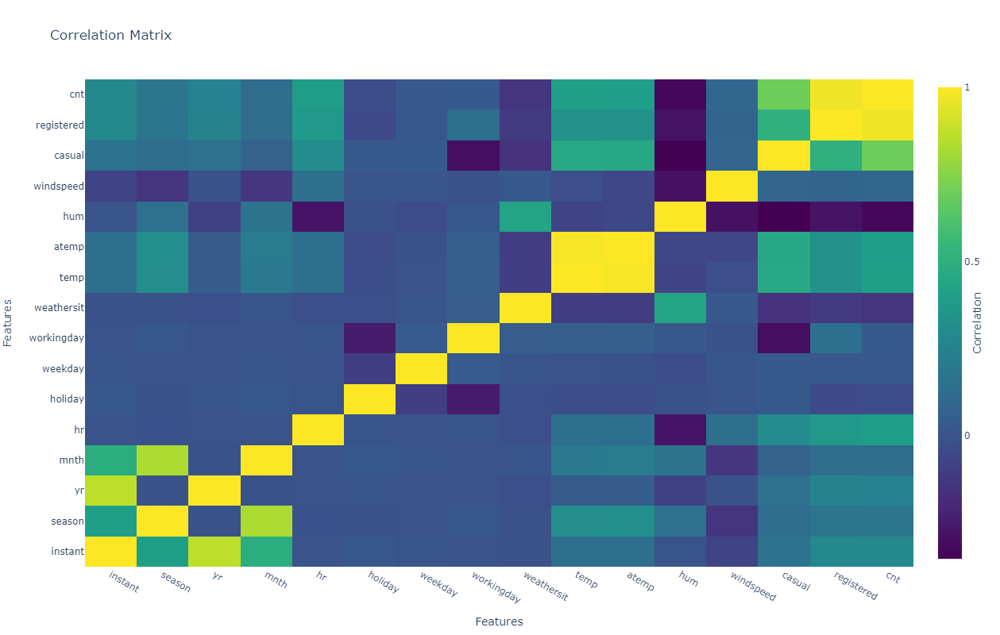

In [24]:
# check correlation between features
corr = data.corr()

# plot correlation matrix with plotly
fig = go.Figure(data=go.Heatmap(
    z=corr.values,
    x=corr.columns,
    y=corr.columns,
    colorscale='Viridis',
    colorbar=dict(
        title="Correlation",
        titleside="right",
        tickmode="array",
        tickvals=[-1, -0.5, 0, 0.5, 1],
        ticktext=["-1", "-0.5", "0", "0.5", "1"]
    )
))
fig.update_layout(
    title="Correlation Matrix",
    xaxis_title="Features",
    yaxis_title="Features",
    width=800,
    height=800
)
fig.show()

- High correlation between all the variables for the user count. Probably we are going to drop the *casual* and *registered* to only have *cnt* which is going to be the target variable.
- High correlation between *mnth* and *season*. It makes sense since the months are what determined the seasons. We need to think to only use one. 
- Both temperatures are really correlated (*temp* and *atemp*). We need to think to only use of them.
- The correlation with the variable *instant* we do not care about them since, we are not going to use *instant* for the models. It is basically an index.

#### NaN Values

Let's check if there are any NaN Values on the data.

In [25]:
data.isna().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

There are no null values. Nothing else to be done here.

### Feature Engineering

#### temp_range and atemp_range

We are going to create a variable to convert the temperatures into a categorical variable using ranges from "cold" to "hot".

In [26]:
#Temperature range categories
temp_bins = [-float('inf'), 0.2, 0.5, 0.8, float('inf')]
temp_labels = ['cold', 'cool', 'warm', 'hot']

#New column temp_range
data['temp_range'] = pd.cut(data['temp'], bins=temp_bins, labels=temp_labels)
data['atemp_range'] = pd.cut(data['atemp'], bins=temp_bins, labels=temp_labels)

In [27]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,temp_range,atemp_range
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,cool,cool
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,cool,cool
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,cool,cool
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,cool,cool
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,cool,cool


In [28]:
data["temp_range"].unique()

['cool', 'cold', 'warm', 'hot']
Categories (4, object): ['cold' < 'cool' < 'warm' < 'hot']

In [29]:
data["atemp_range"].unique()

['cool', 'cold', 'warm', 'hot']
Categories (4, object): ['cold' < 'cool' < 'warm' < 'hot']

#### diff_temp

New variable for the difference between the real temperature and the feeling temperature.

In [30]:
#New column 
data['diff_temp'] = data['atemp'] - data['temp']

In [31]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,temp_range,atemp_range,diff_temp
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,cool,cool,0.0479
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,cool,cool,0.0527
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,cool,cool,0.0527
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,cool,cool,0.0479
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,cool,cool,0.0479


#### hum_range

In the same way as the temperature, we are going to create a categorical feature for the humidity from "Very Dry" to "Very Humid".

In [32]:
#New column hum_range
data['hum_range'] = data['hum'].apply(lambda x: 'Very Dry' if x <= 0.2 else 'Dry' if x <= 0.4 else 'Normal' if x <= 0.6 else 'Humid' if x <= 0.8 else 'Very Humid')

In [33]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,temp_range,atemp_range,diff_temp,hum_range
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,cool,cool,0.0479,Very Humid
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,cool,cool,0.0527,Humid
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,cool,cool,0.0527,Humid
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,cool,cool,0.0479,Humid
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,cool,cool,0.0479,Humid


In [34]:
data["hum_range"].unique()

array(['Very Humid', 'Humid', 'Normal', 'Dry', 'Very Dry'], dtype=object)

####  windspeed_range

New variable to convert the windspeed from a numerical to a categorical.

In [35]:
#New column windspeed_range
data['windspeed_range'] = pd.cut(data['windspeed'], bins=[0.0, 0.25, 0.5, 0.75, 1.0], labels=['0-0.25', '0.25-0.5', '0.5-0.75', '0.75-1'])
data["windspeed_range"] = data["windspeed_range"].fillna('0-0.25')

In [36]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,temp_range,atemp_range,diff_temp,hum_range,windspeed_range
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,cool,cool,0.0479,Very Humid,0-0.25
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,cool,cool,0.0527,Humid,0-0.25
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,cool,cool,0.0527,Humid,0-0.25
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,cool,cool,0.0479,Humid,0-0.25
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,cool,cool,0.0479,Humid,0-0.25


In [37]:
data["windspeed_range"].unique()

['0-0.25', '0.25-0.5', '0.5-0.75', '0.75-1']
Categories (4, object): ['0-0.25' < '0.25-0.5' < '0.5-0.75' < '0.75-1']

#### temp_hum_ratio, atemp_hum_ratio, wind_temp_ratio, wind_atemp_ratio and wind_hum_ratio

We are going to create different ratios between the nunmerical variables that we have. 

In [38]:
#Nem colunm temp_hum_ratio
data['temp_hum_ratio'] = (data['temp'] * 41) / (data['hum'] * 100)
#Nem colunm atemp_hum_ratio
data['atemp_hum_ratio'] = (data['atemp'] * 50) / (data['hum'] * 100)
#Nem colunm wind_temp_ratio
data['wind_temp_ratio'] = (data["windspeed"] * 67)/ (data['temp'] * 41)
#Nem colunm wind_atemp_ratio
data['wind_atemp_ratio'] = (data['windspeed'] * 67) / (data['atemp'] * 50)
#Nem colunm wind_hum_ratio
data['wind_hum_ratio'] = (data['windspeed'] * 67) / (data['hum'] * 100)
#This ratios create some inf values. We are set them to 0.
data = data.replace([np.inf, -np.inf], 0)

In [39]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,temp_range,atemp_range,diff_temp,hum_range,windspeed_range,temp_hum_ratio,atemp_hum_ratio,wind_temp_ratio,wind_atemp_ratio,wind_hum_ratio
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,cool,cool,0.0479,Very Humid,0-0.25,0.121481,0.177716,0.0,0.0,0.0
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0


#### time_since_rain

New variable to obtain the time since it last rainned.

In [40]:
#New column time_since_rain
#Define variables
data['time_since_rain'] = 0
hours_since_rain = 0
#Loop
for i in range(len(data)):
    if (data.loc[i, 'weathersit'] == 3) | (data.loc[i, 'weathersit'] == 4) :
        hours_since_rain = 0
    else:
        hours_since_rain += 1
    data.loc[i, 'time_since_rain'] = hours_since_rain

In [41]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,temp_range,atemp_range,diff_temp,hum_range,windspeed_range,temp_hum_ratio,atemp_hum_ratio,wind_temp_ratio,wind_atemp_ratio,wind_hum_ratio,time_since_rain
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,cool,cool,0.0479,Very Humid,0-0.25,0.121481,0.177716,0.0,0.0,0.0,1
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0,2
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0,3
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0,4
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0,5


#### time_of_day

New variable to transform the hours of the day into categories.

In [42]:
#Time of day categories
time_bins = [-1, 6, 12, 18, 24]
time_labels = ['night', 'morning', 'afternoon', 'evening']
#New columns time_of_day
data['time_of_day'] = pd.cut(data['hr'], bins=time_bins, labels=time_labels)

In [43]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,temp_range,atemp_range,diff_temp,hum_range,windspeed_range,temp_hum_ratio,atemp_hum_ratio,wind_temp_ratio,wind_atemp_ratio,wind_hum_ratio,time_since_rain,time_of_day
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,cool,cool,0.0479,Very Humid,0-0.25,0.121481,0.177716,0.0,0.0,0.0,1,night
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0,2,night
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0,3,night
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0,4,night
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0,5,night


In [44]:
data["time_of_day"].unique()

['night', 'morning', 'afternoon', 'evening']
Categories (4, object): ['night' < 'morning' < 'afternoon' < 'evening']

#### rush_hour

New variable to flag if it is one of the most busy hours of the day or not. 

In [45]:
#New rush_hour column
data['rush_hour'] = data['hr'].apply(lambda x: 1 if (x >= 7 and x <= 9) or (x >= 16 and x <= 18) else 0)

In [46]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,temp_range,atemp_range,diff_temp,hum_range,windspeed_range,temp_hum_ratio,atemp_hum_ratio,wind_temp_ratio,wind_atemp_ratio,wind_hum_ratio,time_since_rain,time_of_day,rush_hour
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,cool,cool,0.0479,Very Humid,0-0.25,0.121481,0.177716,0.0,0.0,0.0,1,night,0
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0,2,night,0
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0,3,night,0
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0,4,night,0
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0,5,night,0


In [47]:
data["rush_hour"].unique()

array([0, 1], dtype=int64)

#### hr_sin, season_sin, weekday_sin and mnth_sin

New variable to transform *season*, *weekday*, *mnth* and *hr* to a cyclical form using the sin.

In [48]:
#New columns for season
data['season_sin'] = np.sin(2*np.pi*data['season']/4)
#New columns for weekday
data['weekday_sin'] = np.sin(2*np.pi*data['weekday']/7)
#New column for month
data['mnth_sin'] = np.sin(2*np.pi*data['mnth']/12)
#New column for hr
data['hr_sin'] = np.sin(2*np.pi*data['mnth']/24)

In [49]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,temp_range,atemp_range,diff_temp,hum_range,windspeed_range,temp_hum_ratio,atemp_hum_ratio,wind_temp_ratio,wind_atemp_ratio,wind_hum_ratio,time_since_rain,time_of_day,rush_hour,season_sin,weekday_sin,mnth_sin,hr_sin
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16,cool,cool,0.0479,Very Humid,0-0.25,0.121481,0.177716,0.0,0.0,0.0,1,night,0,1.0,-0.781831,0.5,0.258819
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0,2,night,0,1.0,-0.781831,0.5,0.258819
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32,cool,cool,0.0527,Humid,0-0.25,0.112750,0.170437,0.0,0.0,0.0,3,night,0,1.0,-0.781831,0.5,0.258819
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0,4,night,0,1.0,-0.781831,0.5,0.258819
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1,cool,cool,0.0479,Humid,0-0.25,0.131200,0.191933,0.0,0.0,0.0,5,night,0,1.0,-0.781831,0.5,0.258819


**IMPORTANT: This features have been tested but, they highly decrease the models prediction power. For this reason, they are not going to be use. This section exist to demostrate that we have tried to used them.**

### Data Preparation

In this section of the notebook, we are going prepare our data in order to test our models.

#### Correlation

After all the different variables that we have created, we are going to study the correlation matrix to see which are the variables that we are going to use for the models.

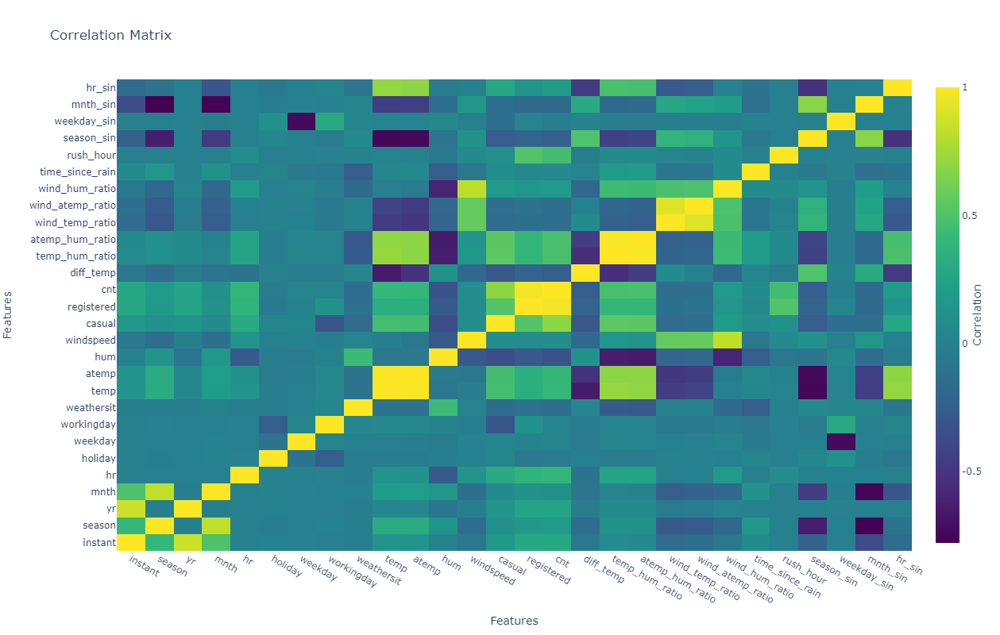

In [50]:
# check correlation between features
corr = data.corr()

# plot correlation matrix with plotly
fig = go.Figure(data=go.Heatmap(
    z=corr.values,
    x=corr.columns,
    y=corr.columns,
    colorscale='Viridis',
    colorbar=dict(
        title="Correlation",
        titleside="right",
        tickmode="array",
        tickvals=[-1, -0.5, 0, 0.5, 1],
        ticktext=["-1", "-0.5", "0", "0.5", "1"]
    )
))
fig.update_layout(
    title="Correlation Matrix",
    xaxis_title="Features",
    yaxis_title="Features",
    width=800,
    height=800
)
fig.show()

- The are correlations between the different temperature variables. Taking this into consideration, we are going to choose only one of them. In this case, we are going to choose *temp* because it has a higher correlation with the target variable that *atemp*.
- The variables *casual* and *registered* have a lot of correlation with the target variable *cnt* but, we are going to drop them because they are basically a breakdown of the target variable and they are useless. 
- There are some correlations with the variable *instant* but, we do not care about it since this feature is going to be drop as it is only an index for the row.
- There are some correlations between the ratios created for the weather variables. In this case, we are going to keep them for now since they are not extremelly high correlated.

After this analysis, let's drop the variables we are not going to use.

In [51]:
prep_data = data.drop(columns = ["instant", "dteday", "atemp", "atemp_range", "casual", "registered", "atemp_hum_ratio", "wind_atemp_ratio", "season_sin", "mnth_sin", "hr_sin", "weekday_sin"])
prep_data.head()

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt,temp_range,diff_temp,hum_range,windspeed_range,temp_hum_ratio,wind_temp_ratio,wind_hum_ratio,time_since_rain,time_of_day,rush_hour
0,1,0,1,0,0,6,0,1,0.24,0.81,0.0,16,cool,0.0479,Very Humid,0-0.25,0.121481,0.0,0.0,1,night,0
1,1,0,1,1,0,6,0,1,0.22,0.80,0.0,40,cool,0.0527,Humid,0-0.25,0.112750,0.0,0.0,2,night,0
2,1,0,1,2,0,6,0,1,0.22,0.80,0.0,32,cool,0.0527,Humid,0-0.25,0.112750,0.0,0.0,3,night,0
3,1,0,1,3,0,6,0,1,0.24,0.75,0.0,13,cool,0.0479,Humid,0-0.25,0.131200,0.0,0.0,4,night,0
4,1,0,1,4,0,6,0,1,0.24,0.75,0.0,1,cool,0.0479,Humid,0-0.25,0.131200,0.0,0.0,5,night,0


#### Column Transformers

**Ordinal Enconder**

The first Tansformer that we are going to ceate is `OrdinalEncoder()` to the categorical features. To do so, we are going to select the categorical features of the data and, after that, we are going to create the *ColumnTransformer* to label encode these columns.

In [52]:
#Select categorical features
categorical_features = ["temp_range", "hum_range", "windspeed_range", "time_of_day", ]

In [53]:
#Transfomer - OrdinalEncoder the categorical variables
label_encoder_transformer = ColumnTransformer(transformers = [("label_encoder_transformation", OrdinalEncoder(), categorical_features)], 
                                              remainder = 'passthrough')

**One Hot Encoder**

In the same way as before, we are going to create a `OneHotEncoder()` *ColumnTransformer*.

In [54]:
#Transfomer - OneHotEncoder the cotegorical variables
ohe_encoder_transformer = ColumnTransformer(transformers = [("ohe_encoder_transformation", OneHotEncoder(drop = "first", sparse=False), categorical_features)], 
                                              remainder = 'passthrough')

**Standard Scaler**

Creation of a *ColumnsTransformer* to apply a `StandardScaler()` to the numerical variables.

First, we need to create a list with all the numerical columns that we have.

In [55]:
numerical_features = ["temp", "hum", "windspeed", "diff_temp", "temp_hum_ratio", "wind_temp_ratio", "wind_hum_ratio", "time_since_rain"]

In [56]:
#Transfomer - StandardScaler the numerical variables
standard_scaler_transformer = ColumnTransformer(transformers = [("standard_scaler_transformation", StandardScaler(), numerical_features)], 
                                                remainder = 'passthrough')

**PCA**

To finish this section, we are going to create a *Pipeline* to apply `PCA()`. There are some correlations between the data so, probably the PCA is going to help us improve our model since we are going to maximize the variance of the variables.

We are going to see wich is the cumulative explanation of the variance that the different PCA variables provide.

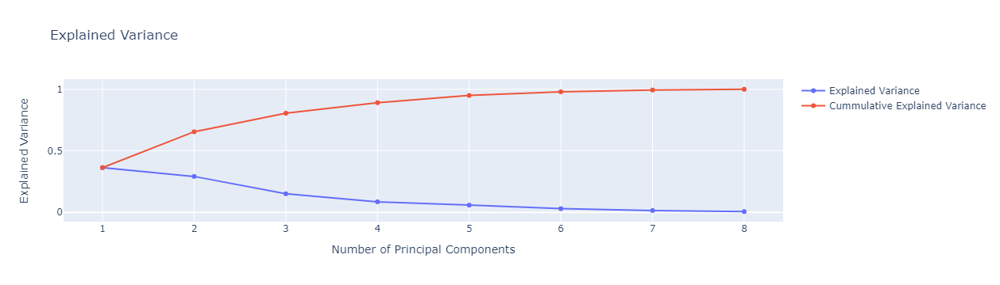

In [57]:
pca = PCA()

#Apply PCA
pca.fit(standard_scaler_transformer.fit_transform(data.loc[:, numerical_features]))

# plotly chart of explained variance
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=np.arange(1, len(pca.explained_variance_ratio_) + 1),
    y=pca.explained_variance_ratio_,
    mode="lines+markers",
    name="Explained Variance"
))
fig.add_trace(go.Scatter(
    x=np.arange(1, len(pca.explained_variance_ratio_) + 1),
    y=np.cumsum(pca.explained_variance_ratio_),
    mode="lines+markers",
    name="Cummulative Explained Variance"
))
fig.update_layout(title="Explained Variance", xaxis_title="Number of Principal Components", yaxis_title="Explained Variance")
fig.show()

As we can see, with around 6-7 PCA variables we are going to be able to explain most of the data.

With all this information, we are going to create the *Pipeline* in order to apply PCA to our numerical features.

In [58]:
#Final PCA Pipeline
pca_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components = 7))
])

#### Data splitting

We are going to split the data into *X_train*, *y_train*, *X_test* and *y_test* in order to test our models.

In [59]:
#Creation of X and y
X = prep_data.drop(columns =  ["cnt"])
y = prep_data["cnt"]
#Split them into X_train, y_train, X_test and y_test
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.3)

In [60]:
X_train.head()

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,hum,windspeed,temp_range,diff_temp,hum_range,windspeed_range,temp_hum_ratio,wind_temp_ratio,wind_hum_ratio,time_since_rain,time_of_day,rush_hour
8039,4,0,12,15,0,2,1,3,0.50,1.00,0.1940,cool,-0.0152,Very Humid,0-0.25,0.205000,0.634049,0.129980,0,afternoon,0
6738,4,0,10,8,0,4,1,3,0.54,1.00,0.0896,warm,-0.0248,Very Humid,0-0.25,0.221400,0.271147,0.060032,0,morning,1
13462,3,1,7,3,0,5,1,2,0.66,0.89,0.1045,warm,-0.0691,Very Humid,0-0.25,0.304045,0.258740,0.078669,3,night,0
5077,3,0,8,11,0,4,1,2,0.74,0.66,0.2239,warm,-0.0430,Humid,0-0.25,0.459697,0.494440,0.227292,8,morning,0
2598,2,0,4,4,0,6,0,3,0.34,1.00,0.0000,cool,0.0236,Very Humid,0-0.25,0.139400,0.000000,0.000000,0,night,0


In [61]:
y_train.head()

8039      45
6738     209
13462     36
5077     149
2598       5
Name: cnt, dtype: int64

#### Creation of the unseen dataset for pycaret

Lastly, we are going extract a sample from the data to have an unseen dataset that we can use in order to test the best model find by *pycaret*. We are going to extract 20% of the original data provided.

In [62]:
#Unseen datasets
unseen_data_pycaret = prep_data.sample(n=3476)
unseen_data_pycaret = unseen_data_pycaret.drop(columns = 'cnt')
#Remove the extracted rows from the original dataframe to avoid data leakage
prep_data_pycaret = prep_data.drop(unseen_data_pycaret.index)

In [63]:
prep_data.shape

(17379, 22)

In [64]:
unseen_data_pycaret.shape

(3476, 21)

In [65]:
prep_data_pycaret.shape

(13903, 22)

## PART II: Prediction Model

### Model 1 - Logistic Regression

The first model that we are going to run is a `LinearRegression()` since it is an easy and good basic model to build on top.

Creation of the LogisticRegression model.

In [66]:
#Instance the model
lr = LinearRegression()

Once we have the instance of the model, we are going to create a *Pipeline* by using the different *ColumnTransformer* that we have created previously. In this case, we are going to apply OneHotEnconder and StandarScaler. 

Creation of the preprocessing *ColumnsTransformer*.

In [67]:
#Preprocessing
lr_preprocessing = ColumnTransformer(
    transformers=[
        ("onehot_encoder", ohe_encoder_transformer, categorical_features),
        ("standard_scaler", standard_scaler_transformer, numerical_features)
    ], 
    remainder="passthrough"
)

Once we have this, we are going to create the *Pipeline* for the Logistic Regression.

In [68]:
#Pipeline for Logistic Regression
lr_pipeline = Pipeline(steps=[('Preprocessing', lr_preprocessing), ('LR', lr)])

We are going to run some cross-validation to make sure that the model is going to work as expected and it is robust.

In [69]:
print(cross_val_score(lr_pipeline, X_train, y_train, cv=5))

[0.60788283 0.62181651 0.58132753 0.59624434 0.60627946]


As it can be seen, the values of the cross validation are quite robust so, we can train our model and predict with it.

In [70]:
lr_pipeline.fit(X_train, y_train)

Pipeline(steps=[('Preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot_encoder',
                                                  ColumnTransformer(remainder='passthrough',
                                                                    transformers=[('ohe_encoder_transformation',
                                                                                   OneHotEncoder(drop='first',
                                                                                                 sparse=False),
                                                                                   ['temp_range',
                                                                                    'hum_range',
                                                                                    'windspeed_range',
                                                                                    'time_of_day'])]),
        

Predictions of the model using the validation data set created.

In [71]:
y_pred = lr_pipeline.predict(X_test)

Scores of the model.

In [72]:
print("R2 Score: ", r2_score(y_test, y_pred))
print("MSE Score: ", mean_squared_error(y_test, y_pred))

R2 Score:  0.6109975429212273
MSE Score:  12461.565700545005


### Model 2 - Logistic Regression + PCA

We are going to run the same model applying PCA.

Creation of the preprocessing *ColumnsTransformer*.

In [73]:
#Preprocessing
lr_preprocessing_pca = ColumnTransformer(
    transformers=[
        ("onehot_encoder", ohe_encoder_transformer, categorical_features),
        ("PCA_pipeline", pca_pipeline, numerical_features)
    ], 
    remainder="passthrough"
)

Creation of the *Pipeline*

In [74]:
#Pipeline for Logistic Regression
lr_pipeline_pca = Pipeline(steps=[('Preprocessing', lr_preprocessing_pca), ('LR', lr)])

Cross-validation of the model.

In [75]:
print(cross_val_score(lr_pipeline_pca, X_train, y_train, cv=5))

[0.60686297 0.62164818 0.57941896 0.59536768 0.60524165]


Fit the model.

In [76]:
lr_pipeline_pca.fit(X_train, y_train)

Pipeline(steps=[('Preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot_encoder',
                                                  ColumnTransformer(remainder='passthrough',
                                                                    transformers=[('ohe_encoder_transformation',
                                                                                   OneHotEncoder(drop='first',
                                                                                                 sparse=False),
                                                                                   ['temp_range',
                                                                                    'hum_range',
                                                                                    'windspeed_range',
                                                                                    'time_of_day'])]),
        

Predictions on the test set.

In [77]:
y_pred_pca = lr_pipeline_pca.predict(X_test)

Scores of the model.

In [78]:
print("R2 Score: ", r2_score(y_test, y_pred_pca))
print("MSE Score: ", mean_squared_error(y_test, y_pred_pca))

R2 Score:  0.6095856678698843
MSE Score:  12506.794653198398


The scores obtain are pretty much the same when applying PCA or not. Since with PCA we are losing interpretability, we would prefer to not use PCA in this case.

### Model 3 - Ridge 

The next model that we are going to apply is `Ridge()`. This works in the same way as the Linear Regression but, it is going to apply a L2 regularization. The steps we are going to follow are the same as before, creation of the preprocessing and applying the model.

Instance of the model. We are going to use `RidgeCV()` to apply Ridge regression with built-in cross-validation.

In [79]:
rd = RidgeCV(alphas = [0.01, 0.1, 1, 10, 100])

Creation of the preprocesing *ColumnTransformer*

In [80]:
#Preprocessing
rd_preprocessing = ColumnTransformer(
    transformers=[
        ("onehot_encoder", ohe_encoder_transformer, categorical_features),
        ("standard_scaler", standard_scaler_transformer, numerical_features),
    ], 
    remainder="passthrough"
)

Creation of the *Pipeline*

In [81]:
#Pipeline for Logistic Regression
rd_pipeline = Pipeline(steps=[('Preprocessing', rd_preprocessing), ('Ridge', rd)])

Fit the model.

In [82]:
rd_pipeline.fit(X_train, y_train)

Pipeline(steps=[('Preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot_encoder',
                                                  ColumnTransformer(remainder='passthrough',
                                                                    transformers=[('ohe_encoder_transformation',
                                                                                   OneHotEncoder(drop='first',
                                                                                                 sparse=False),
                                                                                   ['temp_range',
                                                                                    'hum_range',
                                                                                    'windspeed_range',
                                                                                    'time_of_day'])]),
        

Predictions on the test data.

In [83]:
y_pred_rd = rd_pipeline.predict(X_test)

Score of the model.

In [84]:
print("R2 Score: ", r2_score(y_test, y_pred_rd))
print("MSE Score: ", mean_squared_error(y_test, y_pred_rd))

R2 Score:  0.6109802261093827
MSE Score:  12462.120438913871


We are obtaining the same results as Linear Rgression. Again, we are not able to improve.

### Model 4 - Lasso

The next model that we are going to apply is `Lasso()`. This works in the same way as the Linear Regression but, it is going to apply a L1 regularization. The steps we are going to follow are the same as before, creation of the preprocessing and applying the model.

Instance of the model.

In [85]:
#Instance of the Lasso model
ls = Lasso()

Creation of the preprocessing *ColumnTransformer*.

In [86]:
#Preprocessing
ls_preprocessing = ColumnTransformer(
    transformers=[
        ("onehot_encoder", ohe_encoder_transformer, categorical_features),
        ("standard_scaler", standard_scaler_transformer, numerical_features),
    ], 
    remainder="passthrough"
)

Creation of the *Pipeline*.

In [87]:
#Pipeline for Lasso
ls_pipeline = Pipeline(steps=[('Preprocessing', ls_preprocessing), ('Lasso', ls)])

Cross-validation to make sure that the model is robust.

In [88]:
print(cross_val_score(ls_pipeline, X_train, y_train, cv=5))

[0.60077514 0.61592556 0.57765636 0.58488809 0.60089571]


Fit the model.

In [89]:
ls_pipeline.fit(X_train, y_train)

Pipeline(steps=[('Preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot_encoder',
                                                  ColumnTransformer(remainder='passthrough',
                                                                    transformers=[('ohe_encoder_transformation',
                                                                                   OneHotEncoder(drop='first',
                                                                                                 sparse=False),
                                                                                   ['temp_range',
                                                                                    'hum_range',
                                                                                    'windspeed_range',
                                                                                    'time_of_day'])]),
        

Predictions on test.

In [90]:
y_pred_ls = rd_pipeline.predict(X_test)

Score of the model.

In [91]:
print("R2 Score: ", r2_score(y_test, y_pred_ls))
print("MSE Score: ", mean_squared_error(y_test, y_pred_ls))

R2 Score:  0.6109802261093827
MSE Score:  12462.120438913871


Again, no improvements from Linear Regression.

### Model 5 - ElasticNet

The last regression model that we are going to try is `ElasticNet()`. This model applies a combination of L1 and L2 regularization. Let's see if we get any improvements.

Instance of the model.

In [92]:
el = ElasticNet()

Creation of the preprocessing *ColumnTransformer*

In [93]:
#Preprocessing
el_preprocessing = ColumnTransformer(
    transformers=[
        ("onehot_encoder", ohe_encoder_transformer, categorical_features),
        ("standard_scaler", standard_scaler_transformer, numerical_features),
    ], 
    remainder="passthrough"
)

Creation of the *Pipeline*

In [94]:
#Pipeline for ElasticNet
el_pipeline = Pipeline(steps=[('Preprocessing', ls_preprocessing), ('ElasticNet', el)])

Fit the model.

In [95]:
el_pipeline.fit(X_train, y_train)

Pipeline(steps=[('Preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot_encoder',
                                                  ColumnTransformer(remainder='passthrough',
                                                                    transformers=[('ohe_encoder_transformation',
                                                                                   OneHotEncoder(drop='first',
                                                                                                 sparse=False),
                                                                                   ['temp_range',
                                                                                    'hum_range',
                                                                                    'windspeed_range',
                                                                                    'time_of_day'])]),
        

Predictions of the model.

In [96]:
y_pred_el = el_pipeline.predict(X_test)

Score of the model.

In [97]:
print("R2 Score: ", r2_score(y_test, y_pred_el))
print("MSE Score: ", mean_squared_error(y_test, y_pred_el))

R2 Score:  0.4896094583925453
MSE Score:  16350.193042328512


The results are the worst so far. This model is going to be discarded.

### Model 6 - Pycaret

In order to test all the posible models and their performance, we can use *pycaret*. This is a library that allows us to do autoML and do everything we have done in the 4 previous models but automatically for a really big selection of models. By using this methodology, we can drastically reduce the amount of time necessary to find the best model for our data.

In order to speed up the process of finding the best model, we are going to use this library since we have already demostrate how we could do manually the process of building and testing a model.  

The first function that we are going to use is `setup()`. This function initializes the training environment and creates the transformation pipeline.

In [98]:
setup = setup(data=prep_data_pycaret, target='cnt', silent=True)

,Description,Value
0,session_id,5512
1,Target,cnt
2,Original Data,"(13903, 22)"
3,Missing Values,False
4,Numeric Features,9
5,Categorical Features,12
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(9732, 57)"


The next step is to execute the function `compare_models()`. This function trains and evaluates the performance of all the estimators available in the model library using cross-validation and returns the best model.

In [99]:
best = compare_models(fold=5, sort = 'R2')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,25.7127,1617.3464,40.1851,0.9507,0.4486,0.4664,0.9220
lightgbm,Light Gradient Boosting Machine,27.0619,1762.4699,41.9502,0.9462,0.4249,0.4343,0.0700
rf,Random Forest Regressor,29.0425,2134.8114,46.1864,0.9350,0.3593,0.3388,0.6420
et,Extra Trees Regressor,28.4821,2186.7066,46.7533,0.9335,0.3527,0.3212,0.6360
dt,Decision Tree Regressor,39.7650,4470.8991,66.8451,0.8640,0.4676,0.4030,0.0420
gbr,Gradient Boosting Regressor,46.3216,4592.5919,67.7522,0.8605,0.6588,0.9297,0.4020
knn,K Neighbors Regressor,64.1889,9396.6039,96.8917,0.7150,0.6670,0.9316,0.0560
ada,AdaBoost Regressor,97.1703,12352.6708,111.1397,0.6242,1.3288,4.8979,0.2360
ridge,Ridge Regression,84.6944,12576.2629,112.1163,0.6182,1.0735,2.8674,0.5480
br,Bayesian Ridge,84.7076,12580.8348,112.1358,0.6181,1.0731,2.8734,0.0340


In [100]:
print(best)

As we can see, after comparing many different models performance, the best one for tis case is Catboost Regresor. The scores that we are obtaining are by far the best ones. We have improved our R2 score around 0.6 obtained with the linear regressors to a 0.95.

We are going to create this best model by using the function `create_model()`.

In [101]:
ctb = create_model(best, fold=5)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,27.0593,1855.9420,43.0806,0.9394,0.4310,0.4487
1,25.6662,1519.6209,38.9823,0.9570,0.4526,0.4838
2,25.9527,1622.6535,40.2822,0.9523,0.4482,0.4633
3,25.0730,1601.5621,40.0195,0.9498,0.4645,0.5102
4,24.8124,1486.9532,38.5610,0.9547,0.4464,0.4262
Mean,25.7127,1617.3464,40.1851,0.9507,0.4486,0.4664
Std,0.7865,129.4279,1.5815,0.0061,0.0108,0.0288


Next, we are going to fine tune the model by using the function `tune_model()`. In this case, we are going to optimise it for the MSE.

In [102]:
tuned_ctb = tune_model(ctb, optimize='MSE')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,26.4900,1854.1441,43.0598,0.9399,0.4117,0.4045
1,25.5834,1646.2353,40.5738,0.9460,0.3613,0.3577
2,24.2291,1380.6773,37.1575,0.9632,0.4307,0.4263
3,24.5220,1444.4113,38.0054,0.9563,0.4075,0.4074
4,24.3249,1416.3612,37.6346,0.9604,0.4176,0.4511
5,25.6235,1582.0324,39.7748,0.9510,0.4100,0.4234
6,25.4954,1793.2172,42.3464,0.9447,0.4442,0.4356
7,23.4923,1296.7843,36.0109,0.9587,0.4315,0.4725
8,24.0407,1471.3337,38.3580,0.9537,0.3858,0.3934


This are the best parameters for our model after tuning.

In [103]:
print(tuned_ctb.get_params())

{'depth': 9, 'l2_leaf_reg': 8, 'loss_function': 'RMSE', 'border_count': 254, 'verbose': False, 'random_strength': 0.8, 'task_type': 'CPU', 'n_estimators': 280, 'random_state': 5512, 'eta': 0.1}


The last step is to use the best model to predict on the test set. To do so, we use the function `predict_model()`. This function returns the test dataframe with an extra column called *Label* that contains the predictions of the model.

In [104]:
test_pred = predict_model(tuned_ctb)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,24.5362,1473.8157,38.3903,0.9557,0.3941,0.3932


In [105]:
test_pred.head()

,hr,temp,hum,windspeed,diff_temp,temp_hum_ratio,wind_temp_ratio,wind_hum_ratio,time_since_rain,season_1,...,windspeed_range_0.25-0.5,windspeed_range_0.5-0.75,windspeed_range_0.75-1,time_of_day_afternoon,time_of_day_evening,time_of_day_morning,time_of_day_night,rush_hour_1,cnt,Label
0,3.0,0.36,0.53,0.2985,-0.0267,0.278491,1.354980,0.377349,66.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2,-0.012924
1,5.0,0.66,0.89,0.0000,-0.0691,0.304045,0.000000,0.000000,30.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,38,33.441934
2,7.0,0.20,0.72,0.1940,-0.0030,0.113889,1.585122,0.180528,48.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,104,105.083384
3,21.0,0.42,0.47,0.2836,0.0042,0.366383,1.103438,0.404281,52.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,122,126.219445
4,22.0,0.34,0.49,0.1045,0.0085,0.284490,0.502260,0.142888,93.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,107,109.040533


Finally, we can save this model is we want to use it later. To do so we first finalize the model with the function `finalize_model()` and save it with the function `save_model()`.

In [106]:
# training model with all the data
model = finalize_model(tuned_ctb)

In [107]:
# saving the whole PyCaret pipeline
pipeline = save_model(model, 'ctb_python_assignment')

Transformation Pipeline and Model Successfully Saved


And we could use it in order to predict in some unseen data.

Load the model using the function `load_model()` 

In [108]:
#Loading saved model
final_ctb = load_model(model_name="ctb_python_assignment")

Transformation Pipeline and Model Successfully Loaded


Predictions on the unseen data.

In [109]:
#Predictions using the model
final_pred = predict_model(final_ctb, unseen_data_pycaret)

In [110]:
final_pred.head()

,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,hum,...,diff_temp,hum_range,windspeed_range,temp_hum_ratio,wind_temp_ratio,wind_hum_ratio,time_since_rain,time_of_day,rush_hour,Label
15804,4,1,10,17,0,4,1,1,0.60,0.69,...,-0.0091,Humid,0-0.25,0.356522,0.447211,0.159441,144,afternoon,1,843.095605
13450,3,1,7,15,0,4,1,1,0.84,0.47,...,-0.0673,Normal,0-0.25,0.732766,0.174309,0.127728,24,afternoon,0,258.317277
3051,2,0,5,1,0,4,1,1,0.46,0.88,...,-0.0055,Very Humid,0-0.25,0.214318,0.795403,0.170469,80,night,0,23.236548
15260,4,1,10,1,0,3,1,2,0.62,0.94,...,-0.0745,Very Humid,0-0.25,0.270426,0.000000,0.000000,1,night,0,20.299244
16933,4,1,12,8,0,4,1,1,0.24,0.60,...,-0.0127,Normal,0-0.25,0.164000,1.320935,0.216633,51,morning,1,621.993839


## PART III: Streamlit dashboard

In [111]:
### This part goes in a separate script ###